### Pip install

In [156]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.plot import add_changepoints_to_plot, plot_forecast_component
from prophet.plot import plot_yearly
from prophet.utilities import regressor_coefficients

import warnings
warnings.filterwarnings("ignore")

### Import data

Dataset must contain two columns:

- Datastamp or Timestamp. It should follow the format expected by Pandas, namely YYYY-MM-DD or YYYY-MM-DD HH:MM:SS.
- A numeric value.

In [157]:
PATH = 'https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv'

data = pd.read_csv(PATH)

In [158]:
data.head()

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


In [159]:
data.tail()

,ds,y
2900,2016-01-16,7.817223
2901,2016-01-17,9.273878
2902,2016-01-18,10.333775
2903,2016-01-19,9.125871
2904,2016-01-20,8.891374


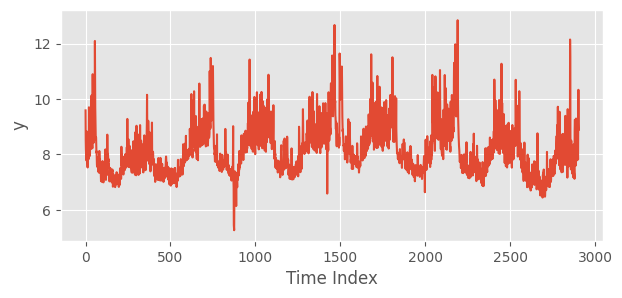

In [160]:
plt.figure(figsize = (7, 3))
plt.plot(data.y)
plt.ylabel('y')
plt.xlabel('Time Index');

In [161]:
# The default model is a linear additive model.

model = Prophet(growth='linear',
        changepoints=None,
        n_changepoints=25,
        changepoint_range=0.8,
        yearly_seasonality='auto',
        weekly_seasonality='auto',
        daily_seasonality='auto',
        holidays=None,
        seasonality_mode='additive',
        seasonality_prior_scale=10.0,
        holidays_prior_scale=10.0,
        changepoint_prior_scale=0.05,
        mcmc_samples=0,
        interval_width=0.8,
        uncertainty_samples=1000,
        stan_backend=None
        )
model.fit(data)
# It includes both the past values, i.e. the ones used for the fitting step,
# and the new ones.
future = model.make_future_dataframe(periods = 365)
future.head()

18:03:25 - cmdstanpy - INFO - Chain [1] start processing
18:03:27 - cmdstanpy - INFO - Chain [1] done processing


In [164]:
future.tail()

,ds
3265,2017-01-15
3266,2017-01-16
3267,2017-01-17
3268,2017-01-18
3269,2017-01-19


In [166]:
forecast = model.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2007-12-10,8.040419,8.194416,9.471460,8.040419,8.040419,0.802893,0.802893,0.802893,0.352293,0.352293,0.352293,0.450600,0.450600,0.450600,0.0,0.0,0.0,8.843312
1,2007-12-11,8.038879,7.988382,9.187406,8.038879,8.038879,0.552971,0.552971,0.552971,0.119630,0.119630,0.119630,0.433341,0.433341,0.433341,0.0,0.0,0.0,8.591850
2,2007-12-12,8.037338,7.717176,9.007685,8.037338,8.037338,0.350348,0.350348,0.350348,-0.066670,-0.066670,-0.066670,0.417018,0.417018,0.417018,0.0,0.0,0.0,8.387686
3,2007-12-13,8.035798,7.769798,8.995539,8.035798,8.035798,0.329821,0.329821,0.329821,-0.072252,-0.072252,-0.072252,0.402073,0.402073,0.402073,0.0,0.0,0.0,8.365619
4,2007-12-14,8.034257,7.753374,8.988316,8.034257,8.034257,0.319338,0.319338,0.319338,-0.069577,-0.069577,-0.069577,0.388915,0.388915,0.388915,0.0,0.0,0.0,8.353595


In [172]:
help(model.plot)

Help on method plot in module prophet.forecaster:

plot(fcst, ax=None, uncertainty=True, plot_cap=True, xlabel='ds', ylabel='y', figsize=(10, 6), include_legend=False) method of prophet.forecaster.Prophet instance
    Plot the Prophet forecast.
    
    Parameters
    ----------
    fcst: pd.DataFrame output of self.predict.
    ax: Optional matplotlib axes on which to plot.
    uncertainty: Optional boolean to plot uncertainty intervals.
    plot_cap: Optional boolean indicating if the capacity should be shown
        in the figure, if available.
    xlabel: Optional label name on X-axis
    ylabel: Optional label name on Y-axis
    figsize: Optional tuple width, height in inches.
    include_legend: Optional boolean to add legend to the plot.
    
    Returns
    -------
    A matplotlib figure.



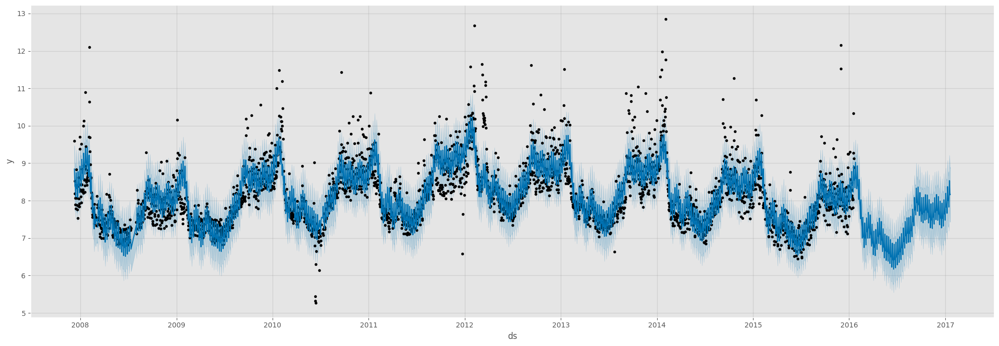

In [184]:
model.plot(forecast, figsize = (20, 7));

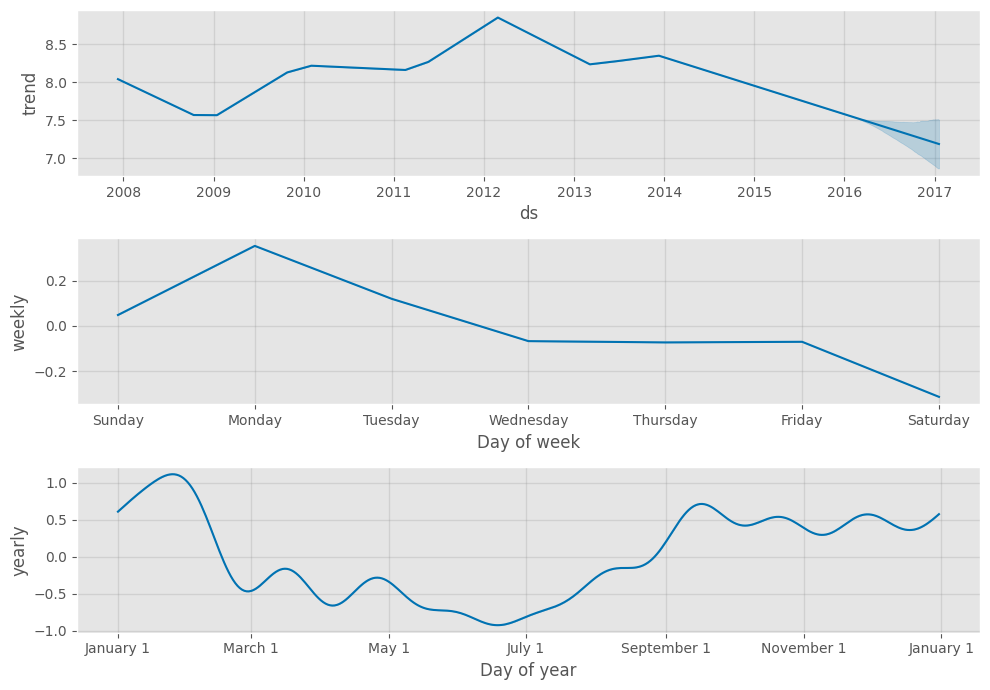

In [168]:
# By default, it shows the trend with the weekly and yearly seasonalities. 
model.plot_components(forecast, figsize = (10, 7));

In [22]:
# plot_plotly(model, forecast)

In [15]:
# plot_components_plotly(model, forecast)

### Forecasting growth

Sometimes the forecasted variable can saturate, e.g. total market size, total population etc. Prophet allows us to make forecasts using a logisitc growth trend model. 

In [185]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_R.csv')

In [186]:
df.head()

,ds,y
0,2008-01-30,5.976351
1,2008-01-16,6.049733
2,2008-01-17,6.011267
3,2008-01-14,5.953243
4,2008-01-15,5.910797


In [187]:
# Set the carrying capacity. It must be defined for each row.
df['cap'] = 8.5

In [188]:
model = Prophet(growth = 'logistic')
model.fit(df)

18:18:00 - cmdstanpy - INFO - Chain [1] start processing
18:18:02 - cmdstanpy - INFO - Chain [1] done processing


In [189]:
future = model.make_future_dataframe(365 * 5)
future['cap'] = 8.5
forecast = model.predict(future) 

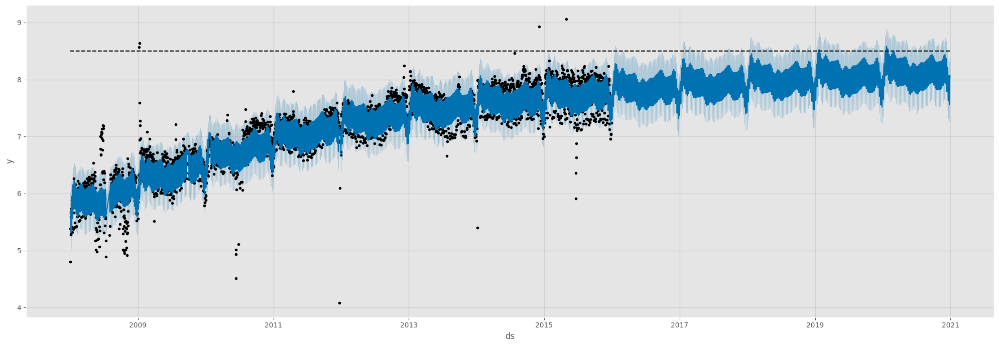

In [190]:
model.plot(forecast, figsize = (20, 7));

On the other hand, it is also possible to saturate the minimum. 

18:19:10 - cmdstanpy - INFO - Chain [1] start processing
18:19:11 - cmdstanpy - INFO - Chain [1] done processing


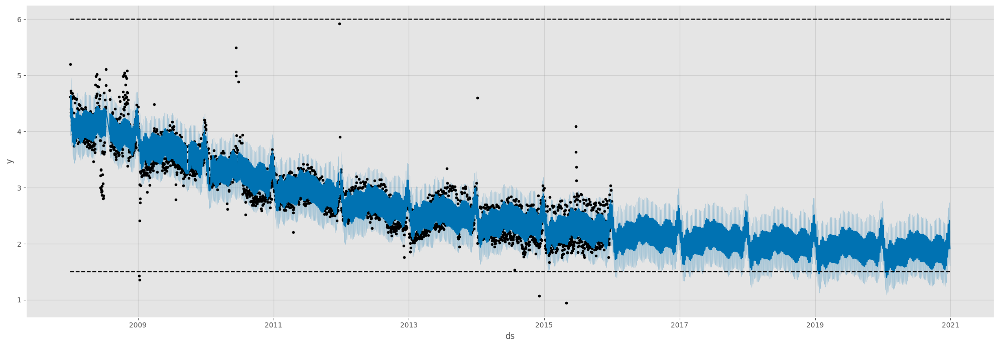

In [191]:
df['y'] = 10 - df['y']
df['cap'] = 6
df['floor'] = 1.5
future['cap'] = 6
future['floor'] = 1.5
model = Prophet(growth='logistic')
model.fit(df)
fcst = model.predict(future)
model.plot(fcst, figsize = (20, 7));

### Trend changepoints

Changepoints are used by prophet to detect abrupt changes in the trajectory. _n_changepoints_ quantifies the number of possible changepoints which will be chosen by a regularization approach.

Moreover, by default the changepoints are inferred for the first 80% of the time series in order to avoid overfitting fluctuations at the end of the time series. However, this percentage can be modified with *changepoint_range*. 

The strength of the regularization approach can be tuned with the *changepoint_prior_scale*: the more that value is, the less the regularization will be.

18:27:56 - cmdstanpy - INFO - Chain [1] start processing
18:27:58 - cmdstanpy - INFO - Chain [1] done processing


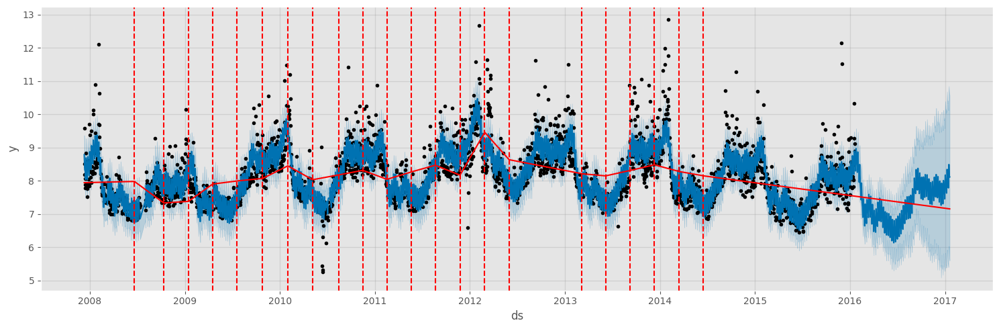

In [197]:
model = Prophet(changepoint_prior_scale = 0.5)
model.fit(data)
future = model.make_future_dataframe(periods = 365)
forecast = model.predict(future)
fig = model.plot(forecast, figsize = (15, 5))
add_changepoints_to_plot(fig.gca(), model, forecast);

18:27:53 - cmdstanpy - INFO - Chain [1] start processing
18:27:54 - cmdstanpy - INFO - Chain [1] done processing


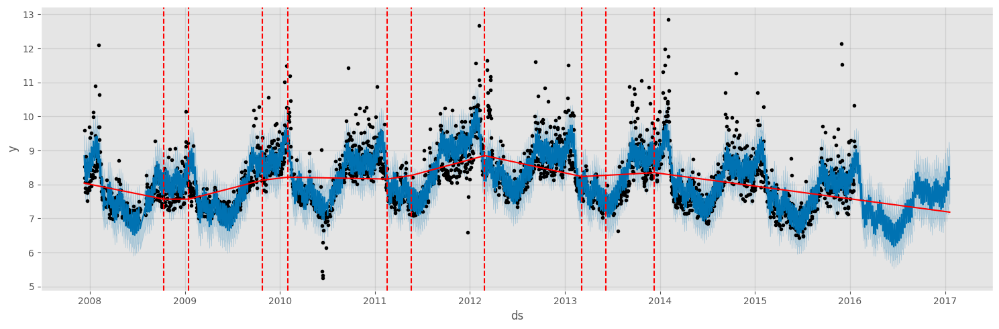

In [196]:
# Changepoints.
# The default model is a linear additive model.

model = Prophet(changepoint_prior_scale=0.05)
model.fit(data)
future = model.make_future_dataframe(periods = 365)
forecast = model.predict(future)
fig = model.plot(forecast, figsize = (15, 5))
add_changepoints_to_plot(fig.gca(), model, forecast);

18:28:10 - cmdstanpy - INFO - Chain [1] start processing
18:28:11 - cmdstanpy - INFO - Chain [1] done processing
18:28:11 - cmdstanpy - ERROR - Chain [1] error: error during processing Unknown error
Optimization terminated abnormally. Falling back to Newton.
18:28:11 - cmdstanpy - INFO - Chain [1] start processing
18:28:19 - cmdstanpy - INFO - Chain [1] done processing


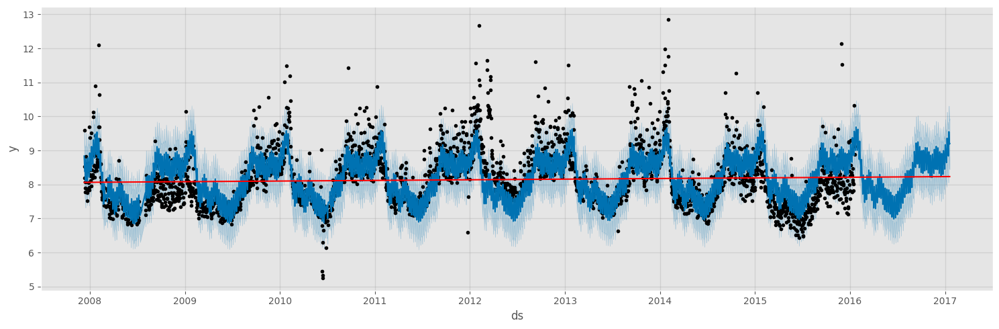

In [198]:
model = Prophet(changepoint_prior_scale = 0.0001)
model.fit(data)
future = model.make_future_dataframe(periods = 365)
forecast = model.predict(future)
fig = model.plot(forecast, figsize = (15, 5))
add_changepoints_to_plot(fig.gca(), model, forecast);

### Holidays

Holidays can be included in the model through some regressors. They can be extended around a specific date by means of [lower_window, upper_window].

Note that with weekly or monthly aggregated data, many holiday effects will be well-captured by the yearly seasonality, so added holidays may only be necessary for holidays that occur in different weeks throughout the time series.

In [203]:
playoffs = pd.DataFrame({
  'holiday': 'playoff',
  'ds': pd.to_datetime(['2008-01-13', '2009-01-03', '2010-01-16',
                        '2010-01-24', '2010-02-07', '2011-01-08',
                        '2013-01-12', '2014-01-12', '2014-01-19',
                        '2014-02-02', '2015-01-11', '2016-01-17',
                        '2016-01-24', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2010-02-07', '2014-02-02', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})

holidays = pd.concat((playoffs, superbowls)).sort_values(['ds'])
holidays.head()

,holiday,ds,lower_window,upper_window
0,playoff,2008-01-13,0,1
1,playoff,2009-01-03,0,1
2,playoff,2010-01-16,0,1
3,playoff,2010-01-24,0,1
4,playoff,2010-02-07,0,1


In [204]:
# Holidays have their own confidence interval.
model = Prophet(holidays = holidays)
model.fit(data)
future = model.make_future_dataframe(periods = 365)
forecast = model.predict(future)
forecast.head()

18:32:25 - cmdstanpy - INFO - Chain [1] start processing
18:32:25 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,holidays,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2007-12-10,8.049142,8.241849,9.469807,8.049142,8.049142,0.796185,0.796185,0.796185,0.0,...,0.329558,0.329558,0.329558,0.466627,0.466627,0.466627,0.0,0.0,0.0,8.845327
1,2007-12-11,8.047500,8.033800,9.250985,8.047500,8.047500,0.585373,0.585373,0.585373,0.0,...,0.133044,0.133044,0.133044,0.452329,0.452329,0.452329,0.0,0.0,0.0,8.632873
2,2007-12-12,8.045857,7.831850,8.996981,8.045857,8.045857,0.385716,0.385716,0.385716,0.0,...,-0.053203,-0.053203,-0.053203,0.438919,0.438919,0.438919,0.0,0.0,0.0,8.431573
3,2007-12-13,8.044215,7.841213,9.029661,8.044215,8.044215,0.367563,0.367563,0.367563,0.0,...,-0.059178,-0.059178,-0.059178,0.426740,0.426740,0.426740,0.0,0.0,0.0,8.411777
4,2007-12-14,8.042572,7.837284,9.027366,8.042572,8.042572,0.359794,0.359794,0.359794,0.0,...,-0.056299,-0.056299,-0.056299,0.416093,0.416093,0.416093,0.0,0.0,0.0,8.402366


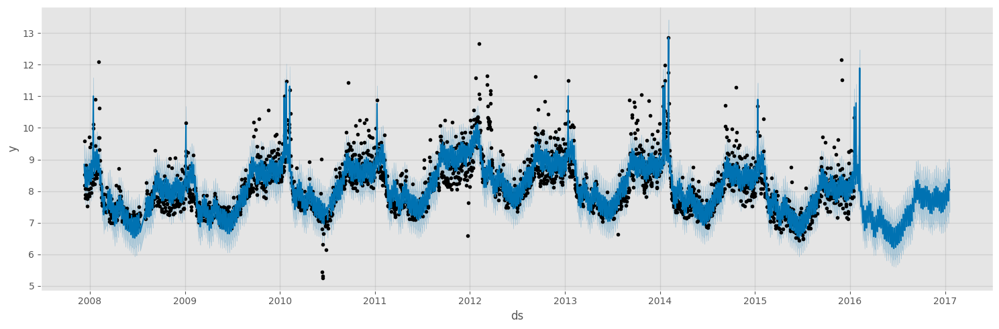

In [207]:
model.plot(forecast, figsize = (15, 5));

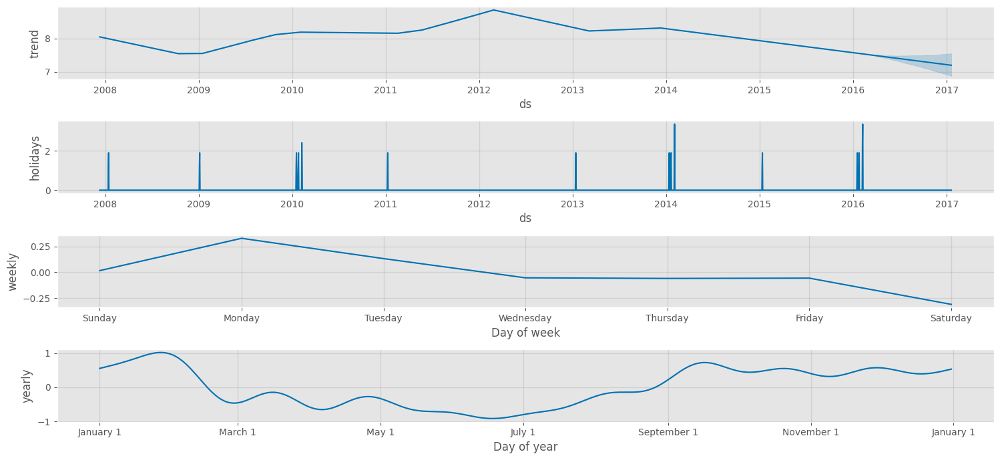

In [208]:
model.plot_components(forecast, figsize = (15, 7));

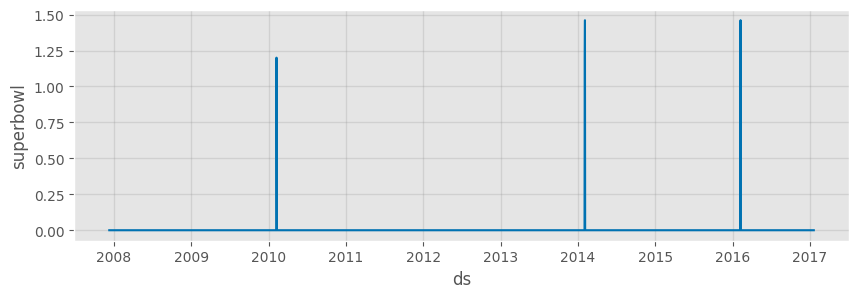

In [209]:
 plot_forecast_component(model, forecast, 'superbowl', figsize = (10, 3));

In [33]:
# It is possible to automatically add some holidays.
model = Prophet(holidays = holidays)
model.add_country_holidays(country_name = 'US')
model.fit(data)
future = model.make_future_dataframe(periods = 365)
forecast = model.predict(future)

10:05:40 - cmdstanpy - INFO - Chain [1] start processing
10:05:42 - cmdstanpy - INFO - Chain [1] done processing


In [34]:
# View the used holidays:  https://github.com/dr-prodigy/python-holidays.
model.train_holiday_names

0                         playoff
1                       superbowl
2                  New Year's Day
3      Martin Luther King Jr. Day
4           Washington's Birthday
5                    Memorial Day
6                Independence Day
7                       Labor Day
8                    Columbus Day
9                    Veterans Day
10                   Thanksgiving
11                  Christmas Day
12       Christmas Day (Observed)
13        Veterans Day (Observed)
14    Independence Day (Observed)
15      New Year's Day (Observed)
dtype: object

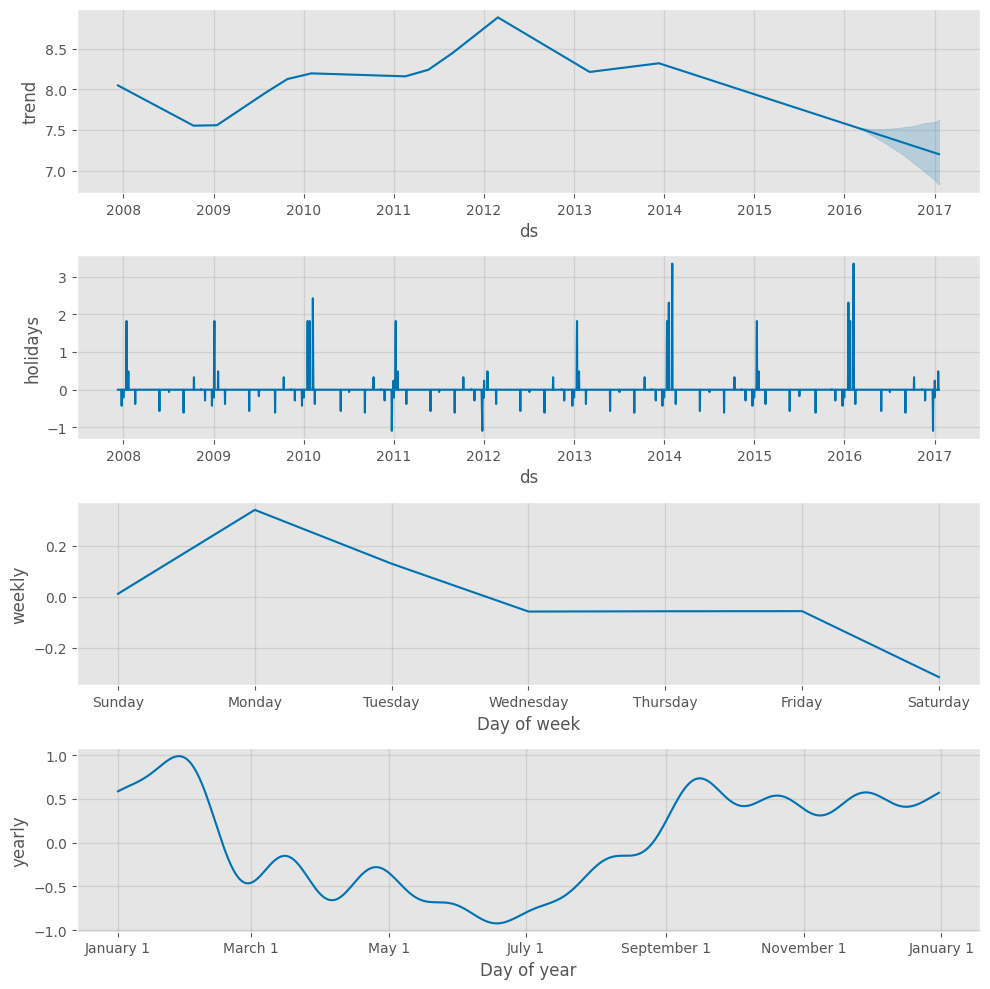

In [38]:
 model.plot_components(forecast, figsize = (10, 10));

In [53]:
# Holidays can overfit, so a reularization procedure can occur.
# The magnitude of the holiday effect has been reduced compared to before,
# especially for superbowls, which had the fewest observations.
model = Prophet(holidays = holidays, holidays_prior_scale = 0.05).fit(data)
forecast = model.predict(future)
forecast[(forecast['playoff'] + forecast['superbowl']).abs() > 0][
    ['ds', 'playoff', 'superbowl']][-10:]

10:58:51 - cmdstanpy - INFO - Chain [1] start processing
10:58:52 - cmdstanpy - INFO - Chain [1] done processing


,ds,playoff,superbowl
2190,2014-02-02,1.209095,0.951442
2191,2014-02-03,1.853105,0.991204
2532,2015-01-11,1.209095,0.000000
2533,2015-01-12,1.853105,0.000000
2901,2016-01-17,1.209095,0.000000
2902,2016-01-18,1.853105,0.000000
2908,2016-01-24,1.209095,0.000000
2909,2016-01-25,1.853105,0.000000
2922,2016-02-07,1.209095,0.951442
2923,2016-02-08,1.853105,0.991204


### Seasonality

Prophet uses the partial Fourier sum in order to estimate an arbitrary periodic signal.
The number of terms in the partial sum, i.e. the orders, is a parameter that determines how quickly the seasonality can change.

N Fourier terms corresponds to 2N variables used for modeling the cycle: so, pay attention because it can lead to ooverfitting.

By default, Prophet fits some seasonalities based on the frequency of the data. For example, it will fit weekly (order = 3) and yearly seasonalities (order = 10), if the time series is more than two cycles long, or daily seasonality if the frequency is daily.

10:12:52 - cmdstanpy - INFO - Chain [1] start processing
10:12:54 - cmdstanpy - INFO - Chain [1] done processing


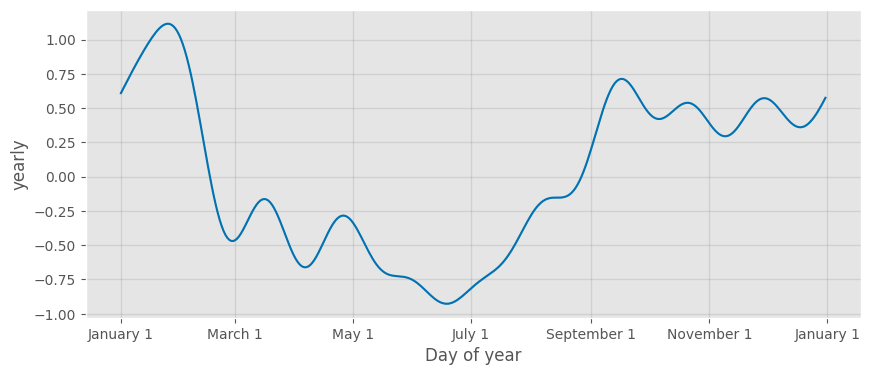

In [40]:
# yearly_seasonality = 10
model = Prophet().fit(data)
plot_yearly(model, figsize = (10, 4))

10:20:25 - cmdstanpy - INFO - Chain [1] start processing
10:20:28 - cmdstanpy - INFO - Chain [1] done processing


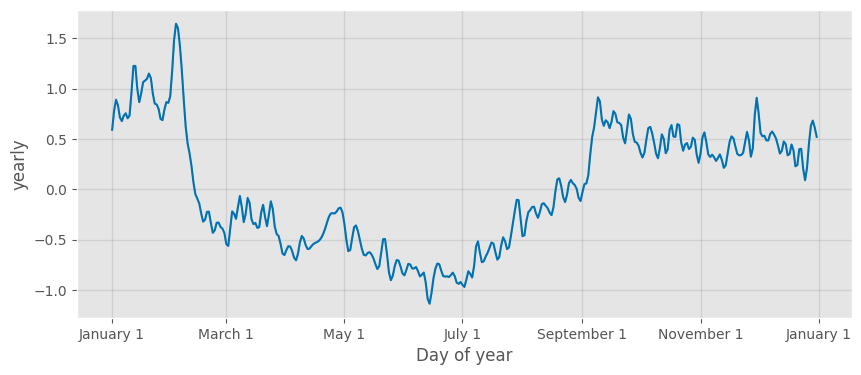

In [41]:
model = Prophet(yearly_seasonality = 100).fit(data)
plot_yearly(model, figsize = (10, 4))

10:45:42 - cmdstanpy - INFO - Chain [1] start processing
10:45:43 - cmdstanpy - INFO - Chain [1] done processing


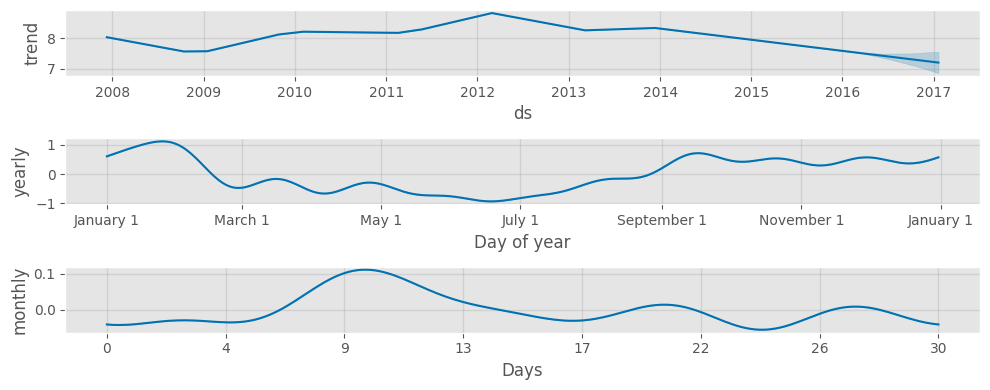

In [44]:
# Python
model = Prophet(weekly_seasonality=False)
model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
forecast = model.fit(data).predict(future)
model.plot_components(forecast, figsize = (10, 4));

In [45]:
# Coditional seasonality: given a specific seasonality, it can change in the same pattern, e.g.
# there is a weekly seasonality but it is different in the weekdays and during the weekend, or
# it can take into account the on and off-season.

In [48]:
def is_nfl_season(ds):
    date = pd.to_datetime(ds)
    return (date.month > 8 or date.month < 2)

data['on_season'] = data['ds'].apply(is_nfl_season)
data['off_season'] = ~data['ds'].apply(is_nfl_season)

10:55:38 - cmdstanpy - INFO - Chain [1] start processing
10:55:39 - cmdstanpy - INFO - Chain [1] done processing


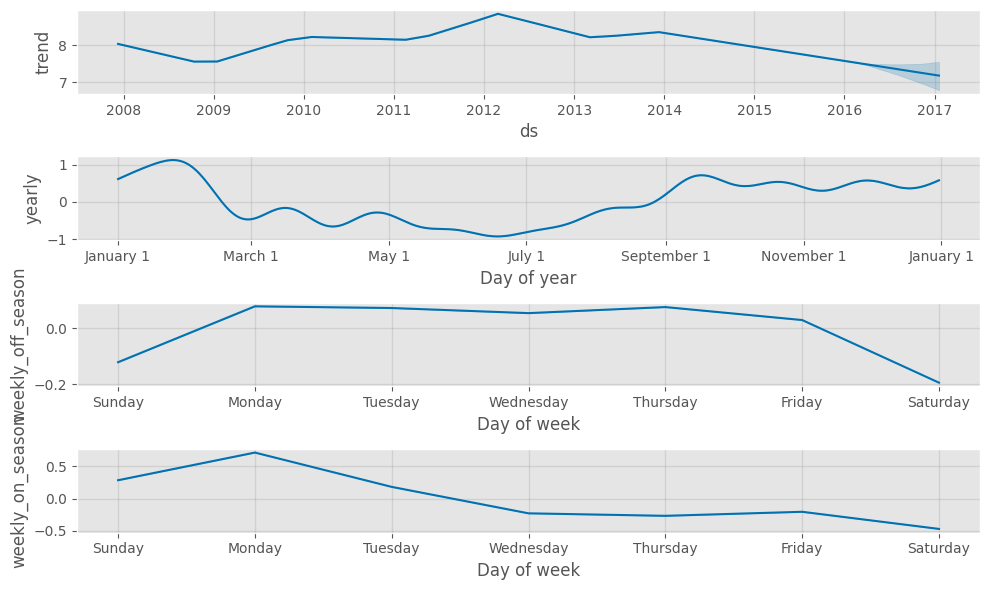

In [51]:
# It shows that there is a different weekly seasonality between the season_on and season_off.
# Indeed, when the season is off, there are no matches during weekend which is not true
# when the season is on.

model = Prophet(weekly_seasonality=False)
model.add_seasonality(name='weekly_on_season', period=7, fourier_order=3, condition_name='on_season')
model.add_seasonality(name='weekly_off_season', period=7, fourier_order=3, condition_name='off_season')

future['on_season'] = future['ds'].apply(is_nfl_season)
future['off_season'] = ~future['ds'].apply(is_nfl_season)
forecast = model.fit(data).predict(future)
model.plot_components(forecast, figsize = (10, 6));

11:03:25 - cmdstanpy - INFO - Chain [1] start processing
11:03:27 - cmdstanpy - INFO - Chain [1] done processing


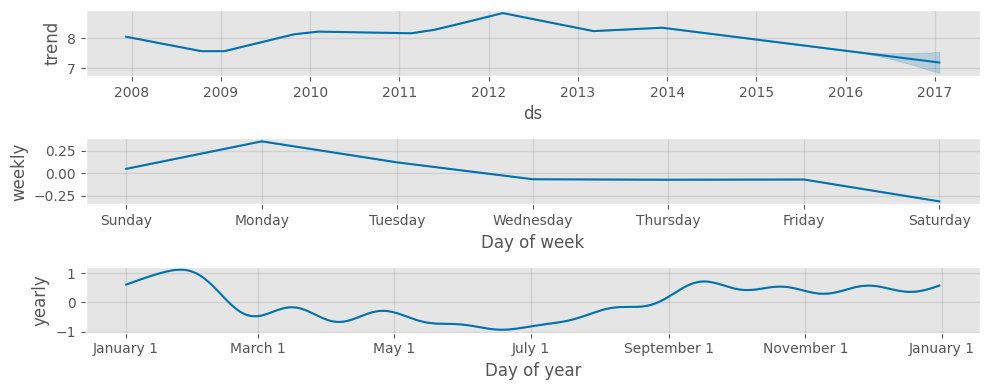

In [54]:
# also the seasonality can be regularized with seasonality_prior_scale.
model = Prophet()
model.add_seasonality(name='weekly', period=7, fourier_order=3, prior_scale=0.1)
forecast = model.fit(data).predict(future)
model.plot_components(forecast, figsize = (10, 4));

### Additional regressors

One additional regressor can be also another time series, e.g. the weather. Moreover, you can forecast that regressor in order to have some future values but it worth only if the forecast of the regressor'erros are less the ones of the target.

11:10:00 - cmdstanpy - INFO - Chain [1] start processing
11:10:01 - cmdstanpy - INFO - Chain [1] done processing


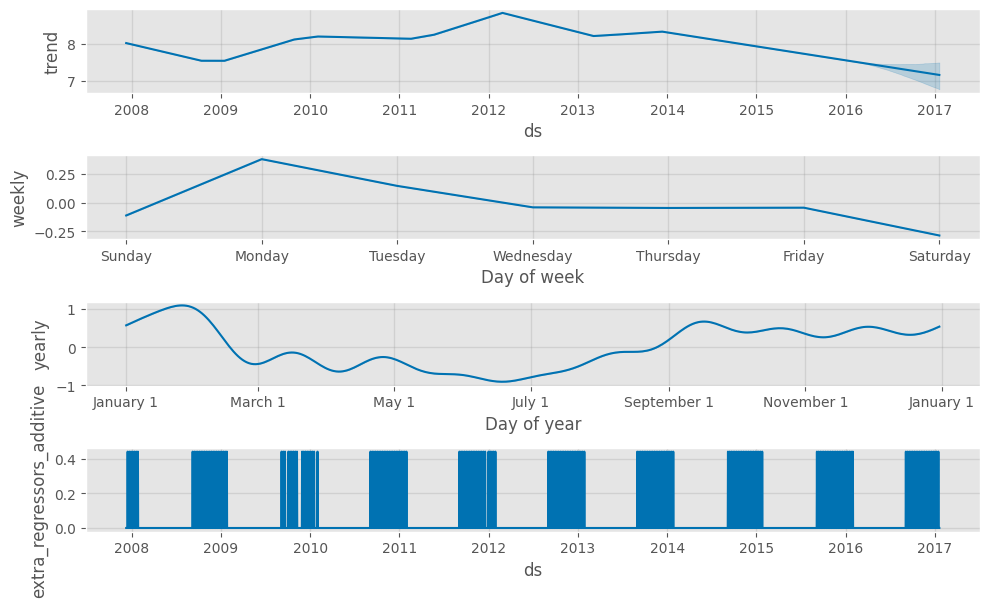

In [59]:
def nfl_sunday(ds):
    date = pd.to_datetime(ds)
    if date.weekday() == 6 and (date.month > 8 or date.month < 2):
        return 1
    else:
        return 0
data['nfl_sunday'] = data['ds'].apply(nfl_sunday)

model = Prophet()
model.add_regressor('nfl_sunday')
model.fit(data)

future['nfl_sunday'] = future['ds'].apply(nfl_sunday)

forecast = model.predict(future)
model.plot_components(forecast, figsize = (10, 6));

In [110]:
regressor_coefficients(model)

AssertionError: No extra regressors found.

### Multiplicative Seasonality

It is more common to add the seasonality to the trend, i.e. an additive seasonality. However, it can be possible that the seasonality increase with the trend, i.e. multiplicative seasonality.

In this situation, also for the other regressors, i.e. holidays, there is a multiplicative factor unless you specify that it should be additive.

Note, however, that it is pretty unlikely to have a mix of additive and multiplicative seasonalities, so this will generally only be used if there is a reason to expect that to be the case.

In [63]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_air_passengers.csv')
df.head()

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


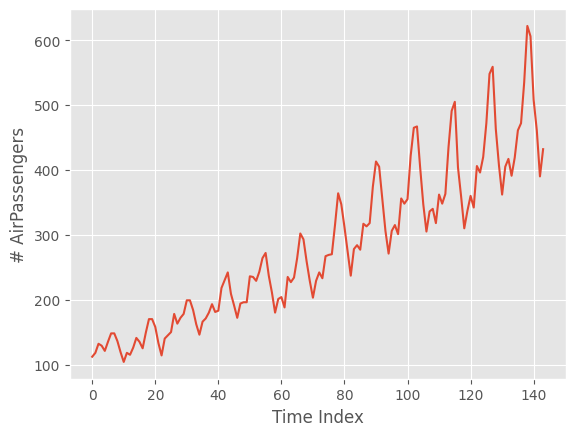

In [67]:
plt.plot(df.y)
plt.xlabel('Time Index')
plt.ylabel('# AirPassengers');

11:53:13 - cmdstanpy - INFO - Chain [1] start processing
11:53:13 - cmdstanpy - INFO - Chain [1] done processing


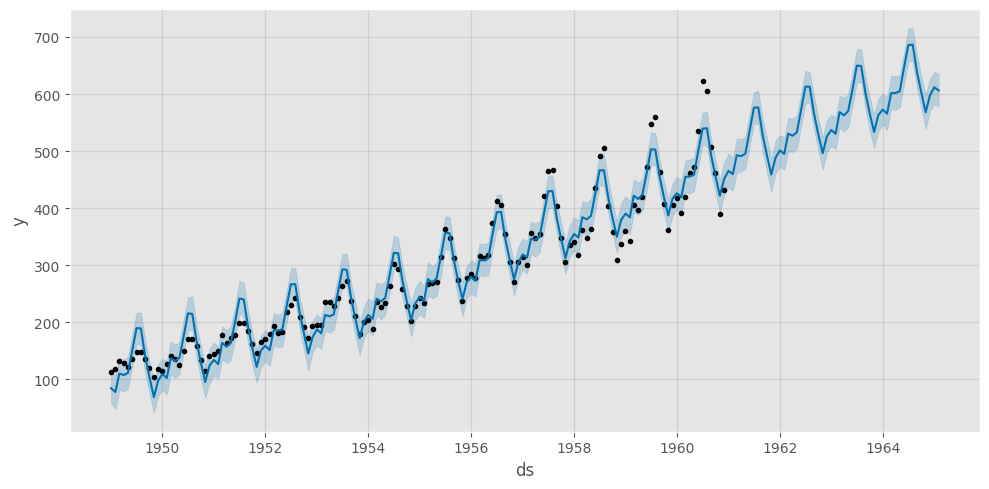

In [69]:
# The main problem of an addititive seasonality is that it cannot take into account
# the different amplitude of the seasonality at the beggining and the ending part of
# the time series.

m = Prophet()
m.fit(df)
future = m.make_future_dataframe(50, freq='MS')
forecast = m.predict(future)
fig = m.plot(forecast, figsize = (10, 5))

11:58:17 - cmdstanpy - INFO - Chain [1] start processing
11:58:17 - cmdstanpy - INFO - Chain [1] done processing


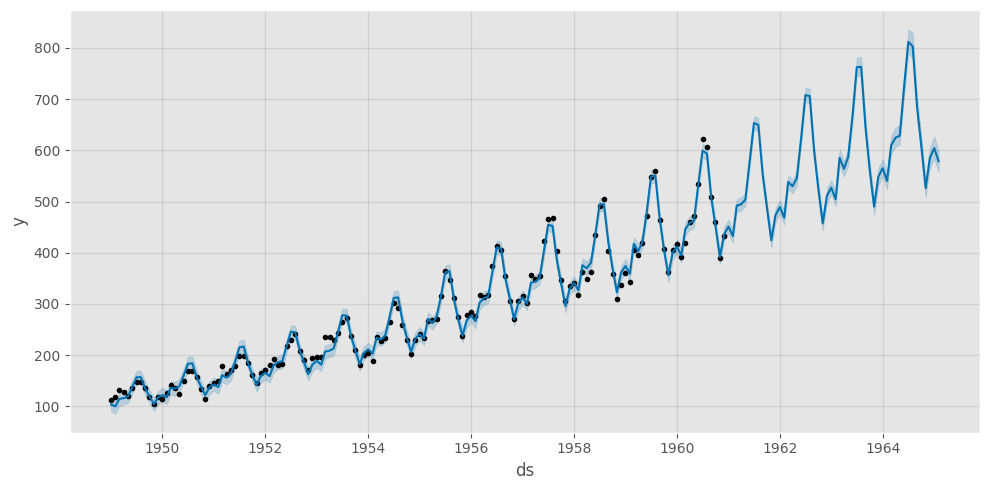

In [77]:
m = Prophet(seasonality_mode = 'multiplicative')
m.fit(df)
future = m.make_future_dataframe(50, freq='MS')
forecast = m.predict(future)
m.plot(forecast, figsize = (10, 5));

### Uncertainty Intervals

The incertainty of the predictions are based on three sources:
- Trend. It relies on the hypothesis that the rate of change on the trend in the training set will be the same also in the test set. This assumption is probably not true, so you should not expect to get accurate coverage on these uncertainty intervals.
- Seasonality. By default, Prophet will only return uncertainties related to the trend and observation noise. To get incertainty in the seasonality, you must do _full Bayesian sampling_.
- Observation noise

In [82]:
# for uncertainty in the seasonality.
m = Prophet(mcmc_samples=300)
future = model.make_future_dataframe(periods = 365)
forecast = m.fit(data, show_progress=False).predict(future)
m.plot_components(forecast, figsize = (10, 4));

12:29:57 - cmdstanpy - INFO - CmdStan installation C:\Users\ravazzil\Anaconda3\envs\github_env\lib\site-packages\prophet\stan_model\cmdstan-2.26.1 missing makefile, cannot get version.
12:29:57 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
12:29:57 - cmdstanpy - INFO - CmdStan start processing
12:29:57 - cmdstanpy - INFO - Chain [1] start processing
12:29:57 - cmdstanpy - INFO - Chain [2] start processing
12:29:57 - cmdstanpy - INFO - Chain [3] start processing
12:29:57 - cmdstanpy - INFO - Chain [4] start processing
12:37:59 - cmdstanpy - INFO - Chain [1] done processing
12:38:06 - cmdstanpy - INFO - Chain [4] done processing
12:38:09 - cmdstanpy - INFO - Chain [3] done processing


KeyboardInterrupt: 

###  Outliers

If outliers aren't taken into account in the model, it will be included in the trend.

So, the best option is to remove them: prophet is able to deal with this situation.

14:41:42 - cmdstanpy - INFO - Chain [1] start processing
14:41:43 - cmdstanpy - INFO - Chain [1] done processing


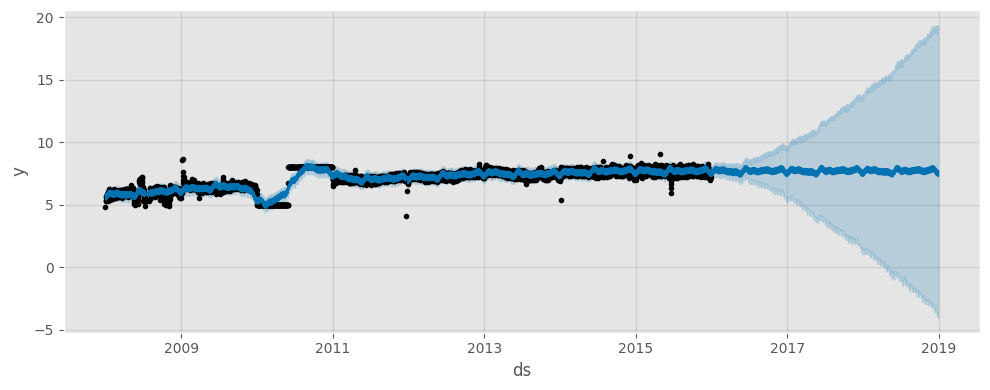

In [93]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_R_outliers1.csv')
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast, figsize = (10, 4))

14:29:49 - cmdstanpy - INFO - Chain [1] start processing
14:29:50 - cmdstanpy - INFO - Chain [1] done processing


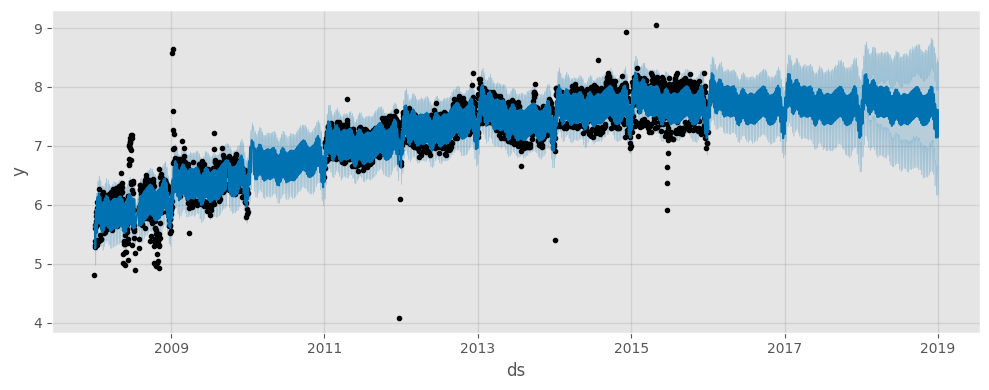

In [88]:
# Prophet imputes missing values. In this case, the
# confidence interval shrink but the predictions remain
# the same (but it isn't always the case).
df.loc[(df['ds'] > '2010-01-01') & (df['ds'] < '2011-01-01'), 'y'] = None
model = Prophet().fit(df)
future = model.make_future_dataframe(periods=1096)
fig = model.plot(model.predict(future), figsize = (10, 4))

### Non-Daily Data

When the format of ds is YYYY-MM-DD HH:MM:SS, Prophet automaticaly fits a daily seasonality.

In [95]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_yosemite_temps.csv')
df.head()

,ds,y
0,2017-05-01 00:00:00,27.8
1,2017-05-01 00:05:00,27.0
2,2017-05-01 00:10:00,26.8
3,2017-05-01 00:15:00,26.5
4,2017-05-01 00:20:00,25.6


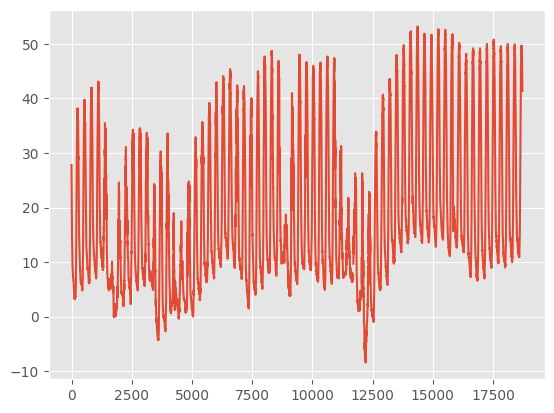

In [97]:
plt.plot(df.y);

14:51:30 - cmdstanpy - INFO - Chain [1] start processing
14:51:35 - cmdstanpy - INFO - Chain [1] done processing


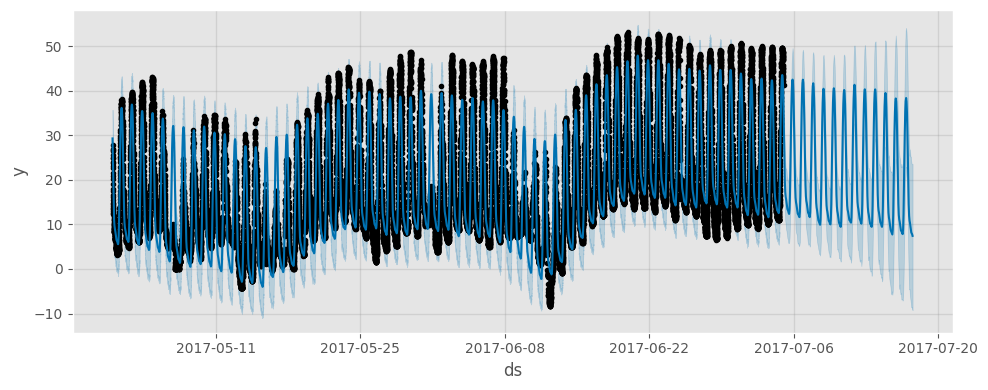

In [98]:
m = Prophet(changepoint_prior_scale=0.01).fit(df)
future = m.make_future_dataframe(periods=300, freq='H')
fcst = m.predict(future)
fig = m.plot(fcst, figsize = (10, 4))

### Gaps in data

14:52:24 - cmdstanpy - INFO - Chain [1] start processing
14:52:27 - cmdstanpy - INFO - Chain [1] done processing


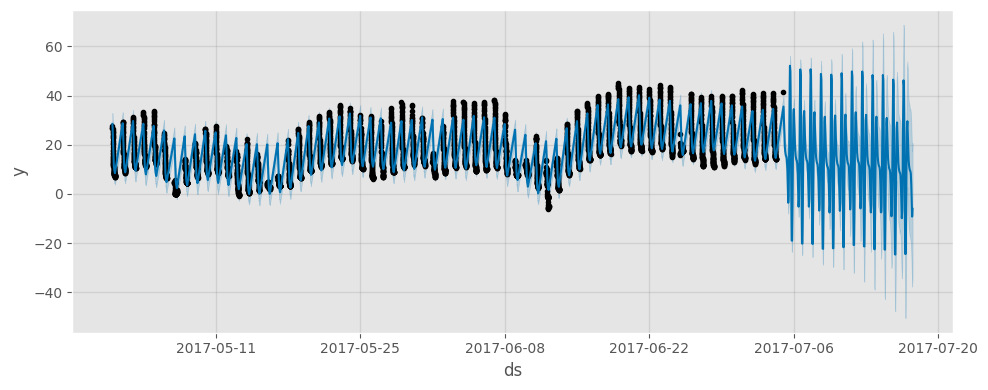

In [101]:
# Data gaps.
df2 = df.copy()
df2['ds'] = pd.to_datetime(df2['ds'])
df2 = df2[df2['ds'].dt.hour < 6]
m = Prophet().fit(df2)
future = m.make_future_dataframe(periods=300, freq='H')
fcst = m.predict(future)
fig = m.plot(fcst, figsize = (10, 4))

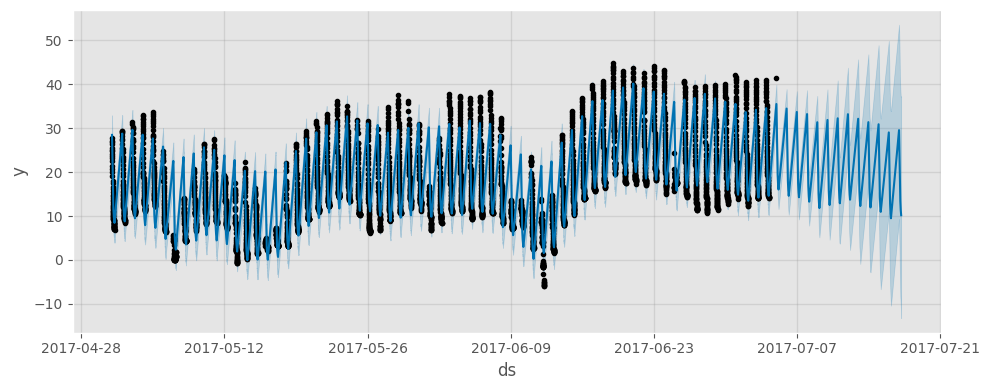

In [103]:
# Drop data that aren't in the gap.
future2 = future.copy()
future2 = future2[future2['ds'].dt.hour < 6]
fcst = m.predict(future2)
fig = m.plot(fcst, figsize = (10, 4))

### Monthly data

In [111]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_retail_sales.csv')
df.head()

,ds,y
0,1992-01-01,146376
1,1992-02-01,147079
2,1992-03-01,159336
3,1992-04-01,163669
4,1992-05-01,170068


15:15:28 - cmdstanpy - INFO - Chain [1] start processing
15:15:29 - cmdstanpy - INFO - Chain [1] done processing


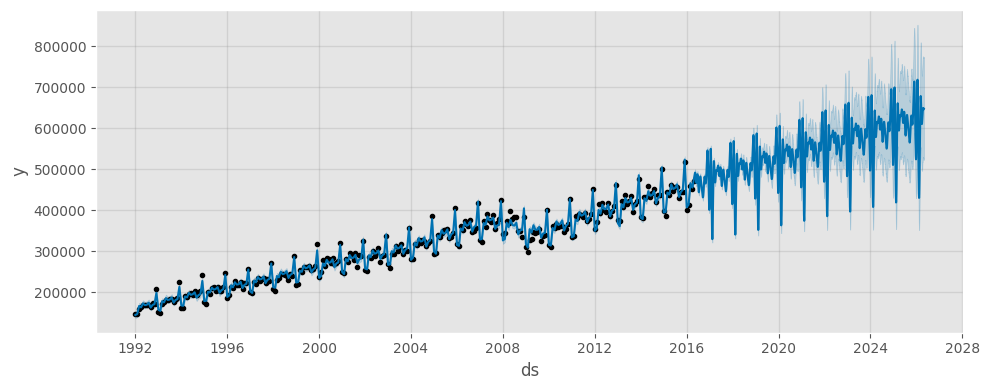

In [112]:
# Even here the predictions take into account the months,
m = Prophet(seasonality_mode = 'multiplicative').fit(df)
future = m.make_future_dataframe(periods=3652)
fcst = m.predict(future)
fig = m.plot(fcst, figsize = (10, 4))

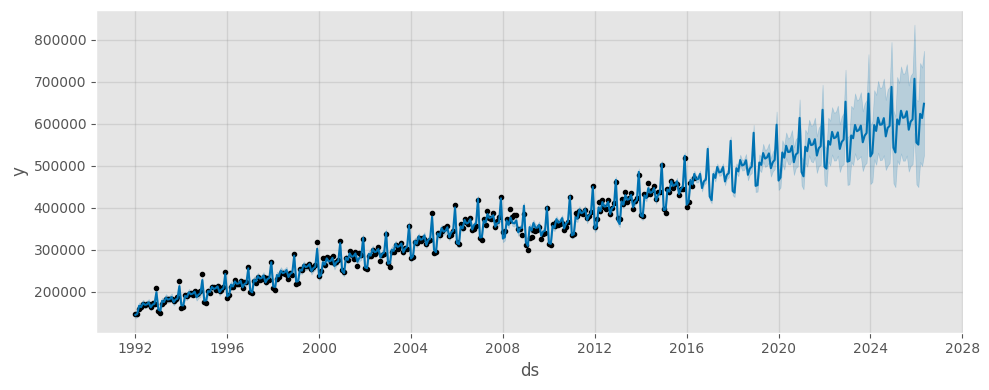

In [120]:
fcst = fcst[fcst.ds.dt.day == 1]
fig = m.plot(fcst, figsize = (10, 4))

### Cross Validation


In [121]:
from prophet.diagnostics import cross_validation

In [123]:
model = Prophet()
model.fit(data)
future = model.make_future_dataframe(periods = 365)
forecast = model.predict(future)

15:48:07 - cmdstanpy - INFO - Chain [1] start processing
15:48:08 - cmdstanpy - INFO - Chain [1] done processing


In [124]:
df_cv = cross_validation(model, initial='730 days', period='180 days', horizon='365 days')

  0%|          | 0/11 [00:00<?, ?it/s]

15:48:15 - cmdstanpy - INFO - Chain [1] start processing
15:48:16 - cmdstanpy - INFO - Chain [1] done processing
15:48:17 - cmdstanpy - INFO - Chain [1] start processing
15:48:17 - cmdstanpy - INFO - Chain [1] done processing
15:48:18 - cmdstanpy - INFO - Chain [1] start processing
15:48:18 - cmdstanpy - INFO - Chain [1] done processing
15:48:18 - cmdstanpy - INFO - Chain [1] start processing
15:48:19 - cmdstanpy - INFO - Chain [1] done processing
15:48:19 - cmdstanpy - INFO - Chain [1] start processing
15:48:20 - cmdstanpy - INFO - Chain [1] done processing
15:48:20 - cmdstanpy - INFO - Chain [1] start processing
15:48:21 - cmdstanpy - INFO - Chain [1] done processing
15:48:21 - cmdstanpy - INFO - Chain [1] start processing
15:48:22 - cmdstanpy - INFO - Chain [1] done processing
15:48:22 - cmdstanpy - INFO - Chain [1] start processing
15:48:23 - cmdstanpy - INFO - Chain [1] done processing
15:48:24 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1]

In [132]:
from prophet.diagnostics import performance_metrics

In [142]:
df_p = performance_metrics(df_cv)
df_p.tail(20)

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
309,346 days,0.869167,0.932291,0.758635,0.094151,0.081010,0.093564,0.530608
310,347 days,0.901724,0.949592,0.772335,0.095489,0.081557,0.094926,0.521928
311,348 days,0.928003,0.963329,0.782548,0.096477,0.082468,0.095922,0.514162
312,349 days,0.943184,0.971176,0.787866,0.096936,0.082468,0.096338,0.510735
313,350 days,0.947741,0.973520,0.788801,0.096999,0.082468,0.096367,0.511878
314,351 days,0.954693,0.977084,0.790213,0.097189,0.082153,0.096487,0.515761
315,352 days,0.961940,0.980786,0.794444,0.097530,0.082153,0.096798,0.517131
316,353 days,0.976582,0.988222,0.799749,0.097956,0.083026,0.097260,0.516583
317,354 days,0.999450,0.999725,0.805551,0.098313,0.083026,0.097658,0.518090
318,355 days,1.027209,1.013513,0.812050,0.098792,0.082068,0.098129,0.519644


In [135]:
from prophet.plot import plot_cross_validation_metric

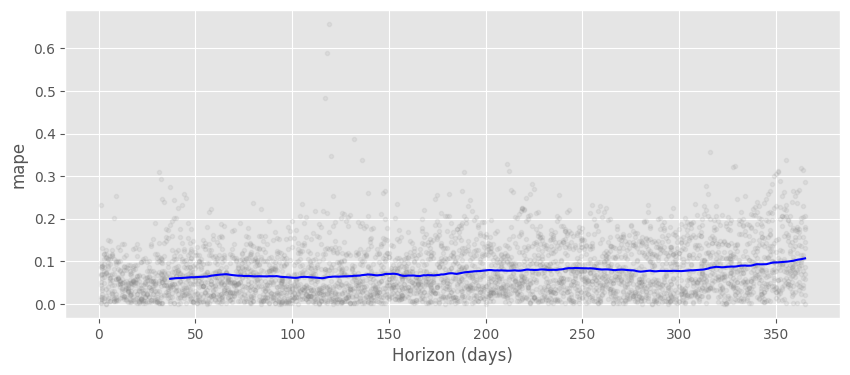

In [139]:
plot_cross_validation_metric(df_cv, metric='mape', figsize = (10, 4));

### Hyperparameter tuning

Prophet is able to tune the hyperparameters and the modt important ones are the following:
- _changepoint_prior_scale_ tune the flexibility of the model. The default of 0.05 works for many time series, but this could be tuned; a range of [0.001, 0.5] would likely be about right.
- _seasonality_prior_scale_ controls the flexibility of the seasonality. The default is 10., which applies basically no regularization because overfitting occurs very rarely. A reasonable range for tuning it would probably be [0.01, 10].
- _holidays_prior_scale_ controls flexibility to fit holiday effects.
- _seasonality_mode_: options are ['additive', 'multiplicative']

Maybe we can tune _changepoint_range_, i.e. this is the proportion of the history in which the trend is allowed to change. Don't change the growth, unless you have a sensible reason; changepoints; n_changepoints, because you focus on regularization; yearly_seasonality, weekly_seasonality and daily_seasonality are automatically added based on the frequency of data; mcmc_samples; interval_width; uncertainty_samples.

In [143]:
import itertools

In [146]:
param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    print(params)
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01}


16:52:03 - cmdstanpy - INFO - Chain [1] start processing
16:52:04 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1}


16:55:00 - cmdstanpy - INFO - Chain [1] start processing
16:55:00 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0}


16:57:59 - cmdstanpy - INFO - Chain [1] start processing
16:57:59 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0}


17:00:57 - cmdstanpy - INFO - Chain [1] start processing
17:00:57 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.01}


17:04:01 - cmdstanpy - INFO - Chain [1] start processing
17:04:01 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1}


17:06:25 - cmdstanpy - INFO - Chain [1] start processing
17:06:25 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0}


17:09:10 - cmdstanpy - INFO - Chain [1] start processing
17:09:11 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0}


17:12:35 - cmdstanpy - INFO - Chain [1] start processing
17:12:35 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.01}


17:15:29 - cmdstanpy - INFO - Chain [1] start processing
17:15:29 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.1}


17:19:41 - cmdstanpy - INFO - Chain [1] start processing
17:19:41 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}


17:27:08 - cmdstanpy - INFO - Chain [1] start processing
17:27:08 - cmdstanpy - INFO - Chain [1] done processing


KeyboardInterrupt: 

### Handling shocks

In order to handle the covid period, add some regressors. Note that since we don’t specify any future dates, Prophet will assume that these holidays will not occur again when creating the future dataframe (and hence they won’t affect our projections). This is different to how we would specify a recurring holiday.

On the other hand, these patterns could be removed and fitted by Prophet.

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_pedestrians_covid.csv')
df.set_index('ds').plot();

In [ ]:
lockdowns = pd.DataFrame([
    {'holiday': 'lockdown_1', 'ds': '2020-03-21', 'lower_window': 0, 'ds_upper': '2020-06-06'},
    {'holiday': 'lockdown_2', 'ds': '2020-07-09', 'lower_window': 0, 'ds_upper': '2020-10-27'},
    {'holiday': 'lockdown_3', 'ds': '2021-02-13', 'lower_window': 0, 'ds_upper': '2021-02-17'},
    {'holiday': 'lockdown_4', 'ds': '2021-05-28', 'lower_window': 0, 'ds_upper': '2021-06-10'},
])
for t_col in ['ds', 'ds_upper']:
    lockdowns[t_col] = pd.to_datetime(lockdowns[t_col])
lockdowns['upper_window'] = (lockdowns['ds_upper'] - lockdowns['ds']).dt.days
lockdowns

In [ ]:
m2 = Prophet(holidays=lockdowns)
m2 = m2.fit(df)
future2 = m2.make_future_dataframe(periods=366)
forecast2 = m2.predict(future2)

In [ ]:
fig = m2.plot(forecast2)
a = add_changepoints_to_plot(fig.gca(), m2, forecast2)

### Save models

In [ ]:
from prophet.serialize import model_to_json, model_from_json

In [ ]:
with open('serialized_model.json', 'w') as fout:
    fout.write(model_to_json(m))  # Save model

with open('serialized_model.json', 'r') as fin:
    m = model_from_json(fin.read())  # Load model